# **1.** **Setup - Get Training Data**


*   Mount Drive w/ MRI Dataset
*   Perform Data Augmentation (optional - opted out)
*   Donwsample Images to create HR-LR Pairs (already done)

**NOTE:**
No need to create HR-LR pairs and augment data more than once, dataset we provide with the project has already been preprocessed

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# check GPU status
! nvidia-smi

In [3]:
# Define your directory paths

train_dataset = '/content/drive/MyDrive/MRIDataset/traindataset'
test_dataset = '/content/drive/MyDrive/MRIDataset/testdataset'
validate_dataset = '/content/drive/MyDrive/MRIDataset/validatedataset'
train_dataset_LR = '/content/drive/MyDrive/MRIDataset/traindataset_LR'
test_dataset_LR = '/content/drive/MyDrive/MRIDataset/testdataset_LR'
validate_dataset_LR = '/content/drive/MyDrive/MRIDataset/validatedataset_LR'

In [ ]:
# directory of MRIDataset
!ls /content/drive/MyDrive/MRIDataset/

**Please Note for the next 5 code blocks:**

* If MRI scans are in 3D .nii format, use the folling code to convert to .jpg
or .png format and extract middle slices

* We have already done this preproccesing step and data is in correct format for this project code to run. HR-LR have been created by injected noise into the HR images

* Optionally, we include code to perfrom various data augmentation, however we have opted out of this step, as in the case of MRI scans, images are rarely to be randomly rotated and or flipped since the patient is in static postion for the MRI scan.

In [ ]:
 # def extract_middle_slice(nii_path, output_dir):
#     # Load the NIfTI file
#     nii_image = nib.load(nii_path)
#     data = nii_image.get_fdata()

#     # Calculate the middle slice index along the third axis (assuming axial slices)
#     middle_index = data.shape[2] // 2

#     # Extract the middle slice
#     middle_slice = data[:, :, middle_index]

#     # Normalize the slice for image representation
#     normalized_slice = ((middle_slice - np.min(middle_slice)) / (np.max(middle_slice) - np.min(middle_slice))) * 255.0
#     slice_image = Image.fromarray(normalized_slice.astype(np.uint8))

#     # Save the slice image
#     filename = os.path.basename(nii_path).replace('.nii', '.jpg')
#     slice_image.save(os.path.join(output_dir, filename))

# def process_nii_files(nii_dir, output_2d_dir):
#     for nii_file in os.listdir(nii_dir):
#         if nii_file.endswith('.nii') or nii_file.endswith('.nii.gz'):
#             nii_path = os.path.join(nii_dir, nii_file)
#             extract_middle_slice(nii_path, output_2d_dir)

In [ ]:
# Call the function for each dataset

# process_nii_files(hr_training_dir, hr_training_2Dslices)
# process_nii_files(hr_validation_dir, hr_validation_2Dslices)
# process_nii_files(hr_testing_dir, hr_testing_2Dslices)

In [ ]:
# import cv2
# import random

# # Define Augmentation and Downsampling Functions

# def random_rotation(image):
#     # Randomly choose an angle for rotation
#     angles = [90, 180, 270]
#     angle = random.choice(angles)
#     return image.rotate(angle)

# def random_flip(image):
#     # Randomly choose axis for flipping
#     flips = [Image.FLIP_LEFT_RIGHT, Image.FLIP_TOP_BOTTOM]
#     mode = random.choice(flips)
#     return image.transpose(mode)

# def random_scale(image, min_scale=0.9, max_scale=1.1):
#     # Randomly choose a scale factor
#     scale_factor = random.uniform(min_scale, max_scale)
#     width, height = image.size
#     scaled_width = int(width * scale_factor)
#     scaled_height = int(height * scale_factor)
#     return image.resize((scaled_width, scaled_height), Image.BICUBIC)

# def random_brightness_contrast(image):
#     # Randomly adjust brightness and contrast
#     enhancer = ImageEnhance.Brightness(image)
#     image = enhancer.enhance(random.uniform(0.8, 1.2))  # Adjust brightness
#     enhancer = ImageEnhance.Contrast(image)
#     return enhancer.enhance(random.uniform(0.8, 1.2))  # Adjust contrast

# def downsample_image(image, scale_factor):
#     # Calculate new dimensions based on scale factor
#     width, height = image.size
#     new_width = int(width / scale_factor)
#     new_height = int(height / scale_factor)

#     # Resize down and up using bicubic interpolation
#     image_down = image.resize((new_width, new_height), Image.BICUBIC)
#     image_up = image_down.resize((width, height), Image.BICUBIC)

#     return np.array(image_up)

# def process_images(hr_input_dir, lr_output_dir, scale_factor):
#     for img_name in os.listdir(hr_input_dir):
#         if img_name.endswith('.jpg'):  # Assuming the slices are saved as '.png'
#             img_path = os.path.join(hr_input_dir, img_name)
#             img = Image.open(img_path)

#             # Convert image to RGB if it's not already in that mode
#             if img.mode != 'RGB':
#                 img = img.convert('RGB')

#             # Apply a series of augmentations
#             augmented_images = [
#                 random_rotation(img),
#                 random_flip(img),
#                 random_scale(img),
#                 random_brightness_contrast(img)
#             ]

#             # Save the original and augmented images in LR form
#             for idx, aug_img in enumerate(augmented_images):
#                 img_lr = downsample_image(aug_img, scale_factor)
#                 aug_img_name = f"LR_aug{idx}_{img_name}"
#                 img_lr = Image.fromarray(img_lr)
#                 img_lr.save(os.path.join(lr_output_dir, aug_img_name))

In [ ]:
# directories = [
#     (hr_training_2Dslices, lr_training_2Dslices),
#     (hr_validation_2Dslices, lr_validation_2Dslices),
#     (hr_testing_2Dslices, lr_testing_2Dslices)
# ]

# for hr_dir, lr_dir in directories:
#     if not os.listdir(lr_dir):  # Checks if the directory is empty
#         process_images(hr_dir, lr_dir, scale_factor=2)
#     else:
#         print(f"2D Slices already downsampled and saved in {lr_dir}!")

# **2.** **Prepare Data Loader**


*   Create Dataset Class to load and preprocess images

  * Resizing & Normalization

  * Return Images as PyTorch Tensors



In [5]:
import os
from PIL import Image
from torchvision import transforms
from torch.utils.data import Dataset

class MRIImageDataset(Dataset):
    def __init__(self, hr_dir, lr_dir, transform=None):
        """
        Args:
            hr_dir (string): Directory with high-resolution images.
            lr_dir (string): Directory with corresponding low-resolution images.
            transform (callable, optional): Optional transform to be applied on a sample.
        """
        self.hr_dir = hr_dir
        self.lr_dir = lr_dir
        self.transform = transform
        self.hr_images = [img for img in os.listdir(hr_dir) if img.endswith('.jpg') or img.endswith('.png')]

    def __len__(self):
        return len(self.hr_images)

    def __getitem__(self, idx):
        img_name = self.hr_images[idx]

        hr_img_path = os.path.join(self.hr_dir, img_name)
        lr_img_path = os.path.join(self.lr_dir, img_name)

        hr_image = Image.open(hr_img_path).convert('RGB')
        lr_image = Image.open(lr_img_path).convert('RGB')

        if self.transform:
            hr_image = self.transform(hr_image)
            lr_image = self.transform(lr_image)

        return {'hr': hr_image, 'lr': lr_image}

# Define transformation for your dataset
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Standard normalization
])

# Instantiate the datasets with your variables
train_dataset_loaded = MRIImageDataset(hr_dir=train_dataset, lr_dir=train_dataset_LR, transform=transform)
validate_dataset_loaded = MRIImageDataset(hr_dir=validate_dataset, lr_dir=validate_dataset_LR, transform=transform)
test_dataset_loaded = MRIImageDataset(hr_dir=test_dataset, lr_dir=test_dataset_LR, transform=transform)


# **3.** **Network Architecture**


*   Number of layers

*   Types of layers
  * Convolutional, Pooling, Upsampling, etc. and activation functions.


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class DenseLayer(nn.Module):
    def __init__(self, in_channels, growth_rate):
        super(DenseLayer, self).__init__()
        self.conv = nn.Conv2d(in_channels, growth_rate, kernel_size=3, padding=1)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        out = self.conv(x)
        out = self.relu(out)
        out = torch.cat([x, out], 1)
        return out

class DenseBlock(nn.Module):
    def __init__(self, in_channels, growth_rate, num_layers):
        super(DenseBlock, self).__init__()
        layers = []
        for i in range(num_layers):
            layers.append(DenseLayer(in_channels + i * growth_rate, growth_rate))
        self.dense_layers = nn.Sequential(*layers)

    def forward(self, x):
        return self.dense_layers(x)

class TransitionLayer(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(TransitionLayer, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)
        self.pool = nn.AvgPool2d(2)

    def forward(self, x):
        out = self.conv(x)
        out = self.pool(out)
        return out

class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.conv1 = nn.Conv2d(channels, channels, kernel_size=3, padding=1)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(channels, channels, kernel_size=3, padding=1)

    def forward(self, x):
        residual = x
        out = self.relu(self.conv1(x))
        out = self.conv2(out)
        out += residual
        return out

class SuperResolutionCNN(nn.Module):
    def __init__(self):
        super(SuperResolutionCNN, self).__init__()
        growth_rate = 32
        num_dense_layers = 4

        # Initial convolution layer
        self.initial_conv = nn.Conv2d(3, 64, kernel_size=3, padding=1)

        # Dense Blocks and Transition Layers
        self.denseblock1 = DenseBlock(64, growth_rate, num_dense_layers)
        self.transition1 = TransitionLayer(64 + growth_rate * num_dense_layers, 64)
        self.denseblock2 = DenseBlock(64, growth_rate, num_dense_layers)
        self.transition2 = TransitionLayer(64 + growth_rate * num_dense_layers, 64)

        # Residual Blocks
        self.resblock1 = ResidualBlock(64)
        self.resblock2 = ResidualBlock(64)

        # Upsampling Layer
        ## -- Note: We changed approach to introduce noise to create LR images as opposed to augmenting and downsampling,
        ##          so upsampling layer scaler factor set to 1. (Which is no upsampling; we've also commented it out below in
        ##          in the layers. The code remains should someone choose to use it for another approach)

        self.upsample = nn.Upsample(scale_factor=4, mode='bilinear', align_corners=True)

        # Output convolution
        self.output_conv = nn.Conv2d(64, 3, kernel_size=3, padding=1)

    def forward(self, x):
        out = self.initial_conv(x)
        out = self.denseblock1(out)
        out = self.transition1(out)
        out = self.denseblock2(out)
        out = self.transition2(out)
        out = self.resblock1(out)
        out = self.resblock2(out)
        out = self.upsample(out)
        out = self.output_conv(out)
        return out

# Initialize the model

if torch.cuda.is_available():
  device = 'cuda'
else:
  device = 'cpu'

model = SuperResolutionCNN().to(device)
print(model)

In [ ]:
pip install torchmetrics

In [ ]:
pip install lpips

# **4.** **Set Parameters, Hyper-Parameters and Evaluation Metrics**


*   Criterion: Mean Squared Error
*   Evaluation Metrics
  *   HR and LR PSNR
  *   Pixel STD
  *   LPIPS
  *   SSIM
*   Training Loop

In [ ]:
from torch.utils.data import DataLoader
from torchvision.transforms.functional import to_tensor
from torchvision.utils import save_image
import torchmetrics
import lpips
lpips_fn = lpips.LPIPS(net='alex').to(device)  # Using AlexNet

# Initialize Data Loaders and Model Parameters
train_loader = DataLoader(train_dataset_loaded, batch_size=16, shuffle=True)
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

def lr_psnr_metric(lr_images, hr_images):
    lr_psnr_metric = torchmetrics.PeakSignalNoiseRatio().to(device)
    lr_psnr_metric.update(lr_images, hr_images)
    return lr_psnr_metric.compute()

def calculate_pixel_std_dev(images):
    images = images.to(device)  # Ensure images are on the GPU
    std_devs = [torch.std(image).item() for image in images]
    return sum(std_devs) / len(std_devs)


def lpips_metric(output, target):
    output = output.to(device)
    target = target.to(device)
    return lpips_fn(output, target).mean()


# Function to compute evaluation metrics
def compute_metrics(model, loader):
    model.eval()
    psnr_metric = torchmetrics.PeakSignalNoiseRatio().to(device)
    ssim_metric = torchmetrics.StructuralSimilarityIndexMeasure().to(device)
    lpips_total, lr_psnr_total, pixel_std_dev_total = 0.0, 0.0, 0.0  # Initialize all accumulators

    # Add more metrics as needed

    with torch.no_grad():
        for batch in loader:
            hr_images = batch['hr'].to(device)
            lr_images = batch['lr'].to(device)
            outputs = model(lr_images)

            psnr_metric.update(outputs, hr_images)
            ssim_metric.update(outputs, hr_images)

            # LPIPS calculation
            lpips_value = lpips_fn(outputs, hr_images).mean()
            lpips_total += lpips_value

            # LR_PSNR calculation
            lr_psnr_value = lr_psnr_metric(lr_images, hr_images)
            lr_psnr_total += lr_psnr_value

            # Pixel Standard Deviation calculation
            pixel_std_dev_value = calculate_pixel_std_dev(outputs)
            pixel_std_dev_total += pixel_std_dev_value


    num_batches = len(loader)

    return psnr_metric.compute(), ssim_metric.compute(), lpips_total / num_batches, lr_psnr_total / num_batches, pixel_std_dev_total / num_batches

# Function to validate model
def validate_model(model, loader):
    model.eval()
    total_loss = 0
    with torch.no_grad():
        for batch in loader:
            hr_images = batch['hr'].to(device)
            lr_images = batch['lr'].to(device)
            outputs = model(lr_images)
            loss = criterion(outputs, hr_images)
            total_loss += loss.item()

    avg_loss = total_loss / len(loader)
    return avg_loss

def save_images(lr_images, generated_hr_images, lr_dir, hr_dir, epoch, batch_idx):
    # Create directories if they don't exist
    os.makedirs(lr_dir, exist_ok=True)
    os.makedirs(hr_dir, exist_ok=True)

    for i, (lr_image, hr_image) in enumerate(zip(lr_images, generated_hr_images)):
        lr_save_path = os.path.join(lr_dir, f"epoch{epoch}_batch{batch_idx}_lr{i}.jpg")
        hr_save_path = os.path.join(hr_dir, f"epoch{epoch}_batch{batch_idx}_hr{i}.jpg")

        # Save images
        save_image(lr_image, lr_save_path)
        save_image(hr_image, hr_save_path)

In [ ]:
#Training Loop
best_loss = float('inf')
num_epochs = 30
save_interval = 10
sr_dir = '/content/drive/MyDrive/MRIDataset/SR_slices'
lr_dir = '/content/drive/MyDrive/MRIDataset/lr_slices'


for epoch in range(num_epochs):
    model.train()
    total_loss = 0.0
    num_batches = 0

    for batch_idx, batch in enumerate(train_loader):
        hr_images = batch['hr'].to(device)
        lr_images = batch['lr'].to(device)

        outputs = model(lr_images)

        # Save HR images conditionally
        if epoch % save_interval == 0:
            save_images(lr_images.cpu(), outputs.cpu(), lr_dir, sr_dir, epoch, batch_idx)


        loss = criterion(outputs, hr_images)
        total_loss += loss.item()
        num_batches += 1

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    avg_training_loss = total_loss / num_batches
    val_loss = validate_model(model, validation_loader)
    psnr, ssim, lpips_value, lr_psnr, pixel_std_dev = compute_metrics(model, validation_loader)

    print(f'Epoch [{epoch+1}/{num_epochs}], Avg Training Loss: {avg_training_loss}, Validation Loss: {val_loss}, PSNR: {psnr}, SSIM: {ssim},lpips valu: {lpips_value}, LRPSNR: {lr_psnr} PXL STD: {pixel_std_dev}')

    if val_loss < best_loss:
      best_loss = val_loss
      torch.save(model.state_dict(), '/content/drive/MyDrive/MRIDataset/super_resolution_model.pth')
      print(f'Model saved at epoch {epoch+1} with validation loss: {val_loss}')


In [23]:
#Uncommnent and run to clear generated images direcotry

# rm -r /content/drive/MyDrive/MRIDataset/lr_slices
# rm -r /content/drive/MyDrive/MRIDataset/SR_slices

# **5.** **Model Validation**

* Compare LR and SR Images

* Compare SR and Original HR Images

* Validation Results Reported

In [28]:
import matplotlib.pyplot as plt

model_path = '/content/drive/MyDrive/MRIDataset/super_resolution_model.pth'
model = SuperResolutionCNN().to(device)
model.load_state_dict(torch.load(model_path))
model.eval()

validation_loader = DataLoader(validate_dataset_loaded, batch_size=16, shuffle=False)

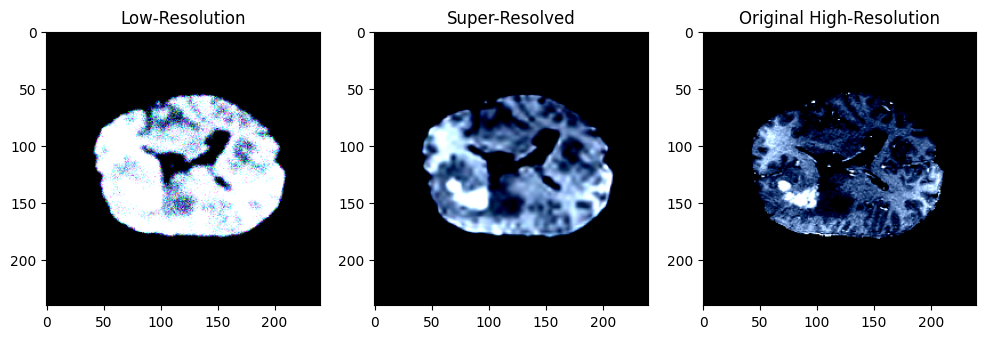

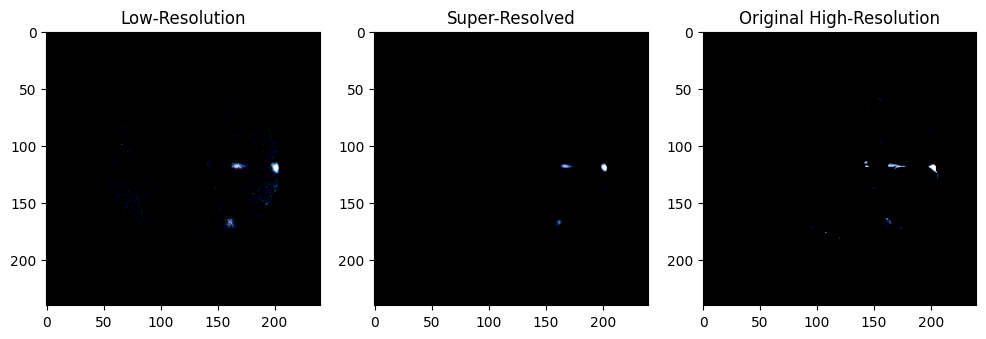

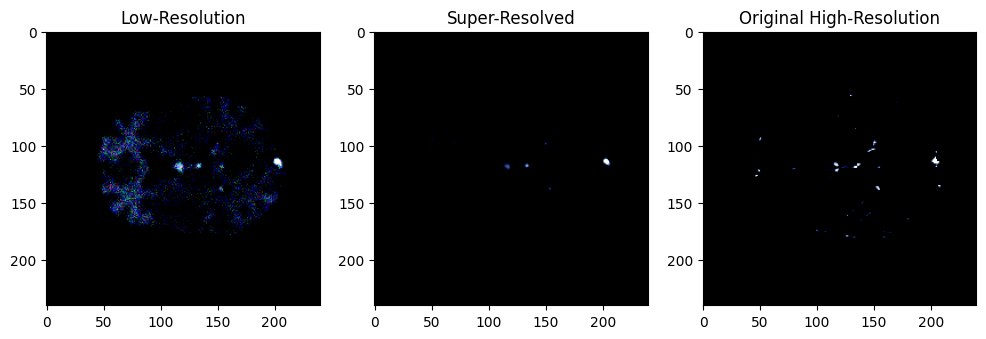

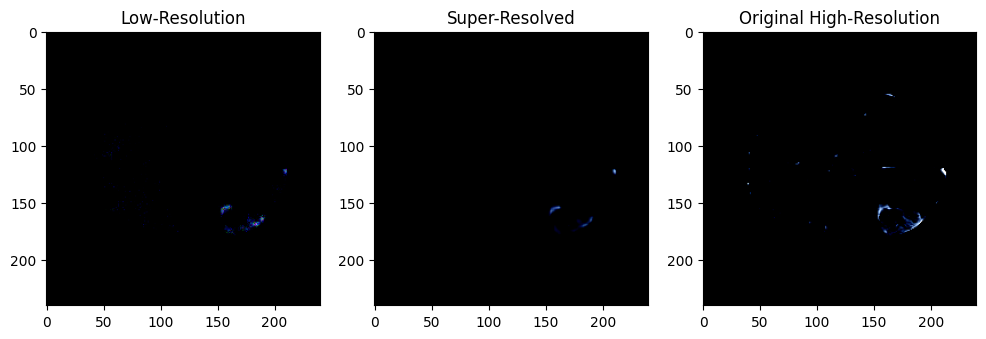

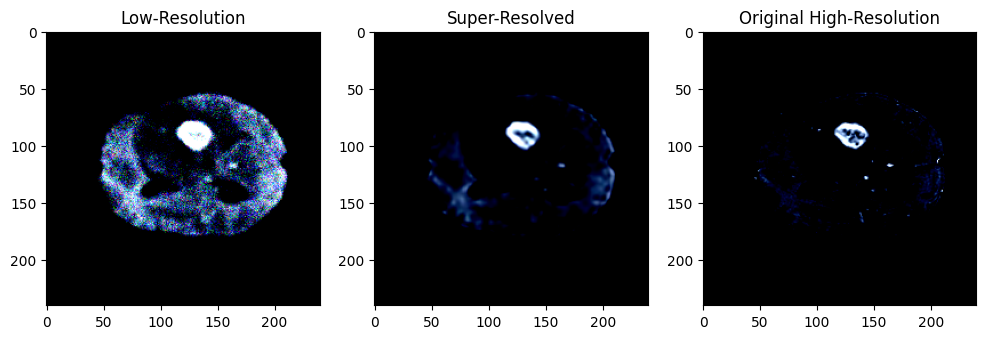

...

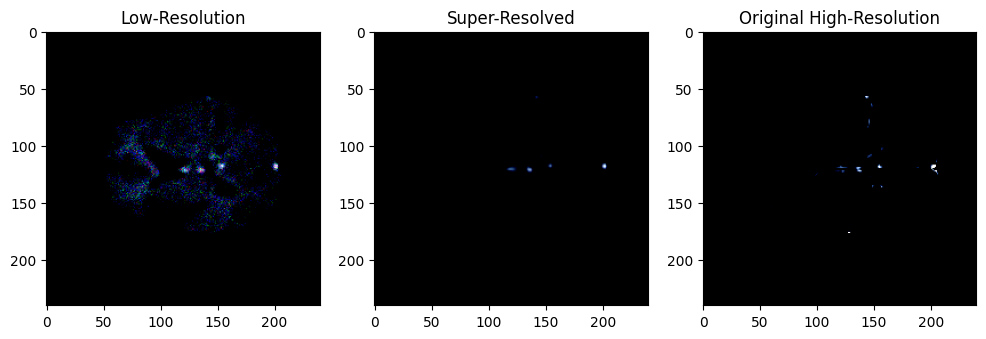

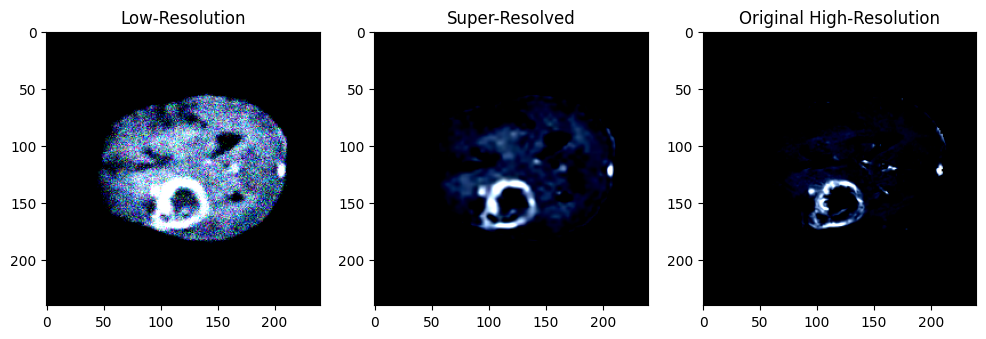

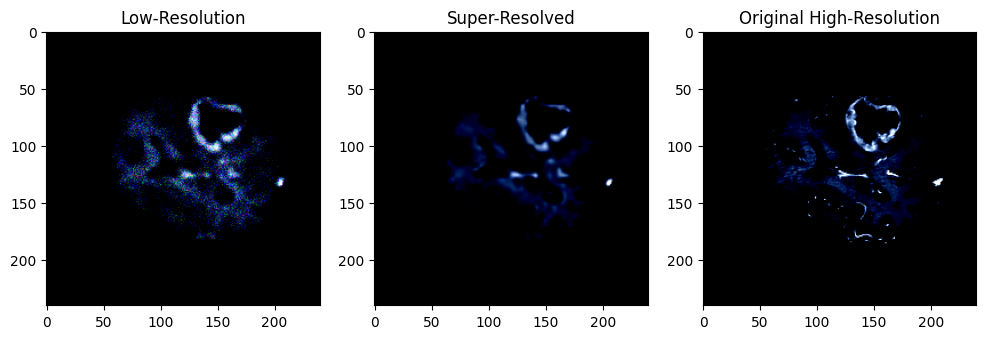

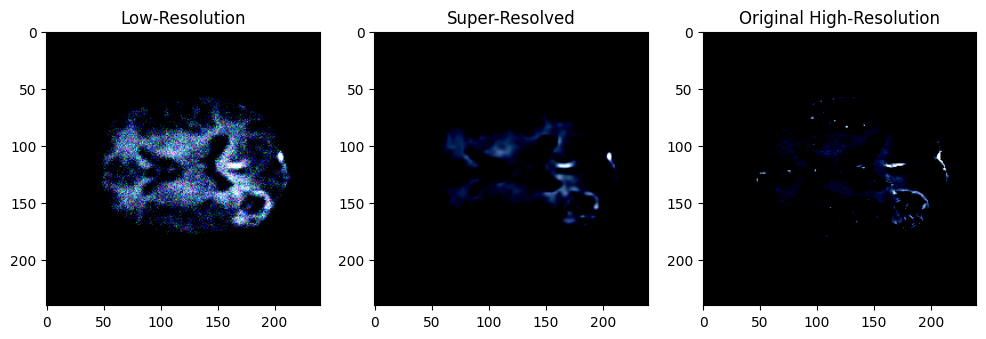

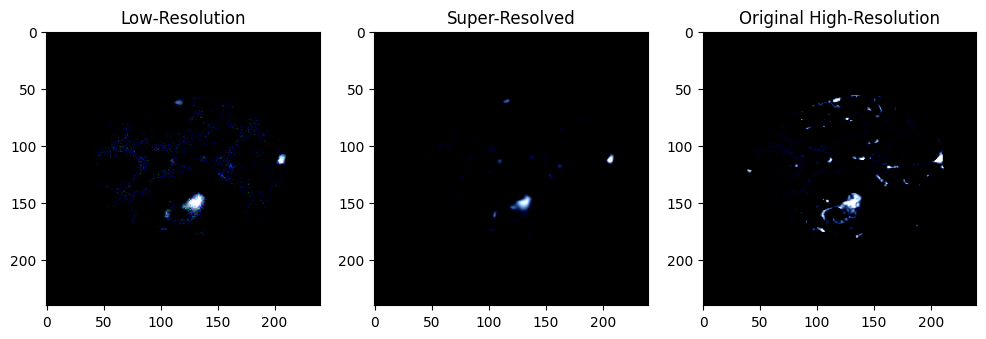

Validation Loss: 0.019116026621001463, PSNR: 30.727340698242188, SSIM: 0.8812181353569031, LPIPS: 0.21277493238449097, LR PSNR: 23.59374237060547, Pixel Std Dev: 0.7807077622661988


In [31]:
# Parameters
num_images_to_plot = 5  # Number of image sets to plot
plot_interval = 10  # Interval for plotting (in terms of batches)

# Validation loop with plotting
with torch.no_grad():
    val_loss, psnr, ssim, lpips_value, lr_psnr, pixel_std_dev = 0, 0, 0, 0, 0, 0
    for batch in validation_loader:
        hr_images = batch['hr'].to(device)
        lr_images = batch['lr'].to(device)
        outputs = model(lr_images)

         # Plot images conditionally
        if batch_idx % plot_interval == 0:
            for i in range(min(num_images_to_plot, hr_images.size(0))):
                plt.figure(figsize=(12, 4))

                # Plot LR image
                plt.subplot(1, 3, 1)
                plt.imshow(lr_images[i].cpu().permute(1, 2, 0))
                plt.title("Low-Resolution")

                # Plot SR image
                plt.subplot(1, 3, 2)
                plt.imshow(outputs[i].cpu().detach().permute(1, 2, 0))
                plt.title("Super-Resolved")

                # Plot Original HR image
                plt.subplot(1, 3, 3)
                plt.imshow(hr_images[i].cpu().permute(1, 2, 0))
                plt.title("Original High-Resolution")

                plt.show()

        # Calculate loss
        loss = criterion(outputs, hr_images)
        val_loss += loss.item()

        # Calculate other metrics
        batch_psnr, batch_ssim, batch_lpips, batch_lr_psnr, batch_pixel_std = compute_metrics(model, validation_loader)
        psnr += batch_psnr
        ssim += batch_ssim
        lpips_value += batch_lpips
        lr_psnr += batch_lr_psnr
        pixel_std_dev += batch_pixel_std

    # Average metrics over all batches
    num_batches = len(validation_loader)
    val_loss /= num_batches
    psnr /= num_batches
    ssim /= num_batches
    lpips_value /= num_batches
    lr_psnr /= num_batches
    pixel_std_dev /= num_batches

print(f'Validation Loss: {val_loss}, PSNR: {psnr}, SSIM: {ssim}, LPIPS: {lpips_value}, LR PSNR: {lr_psnr}, Pixel Std Dev: {pixel_std_dev}')

# **6.** **Model Testing on New Data Set**

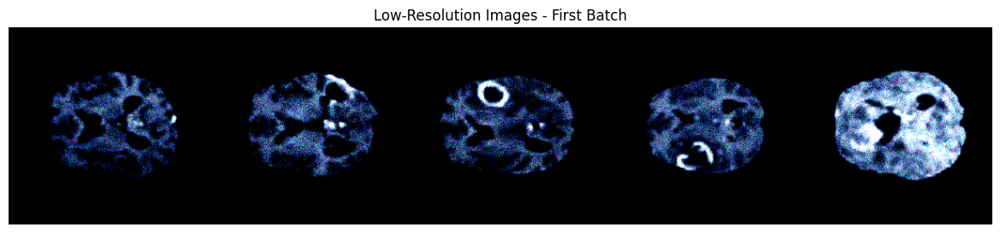

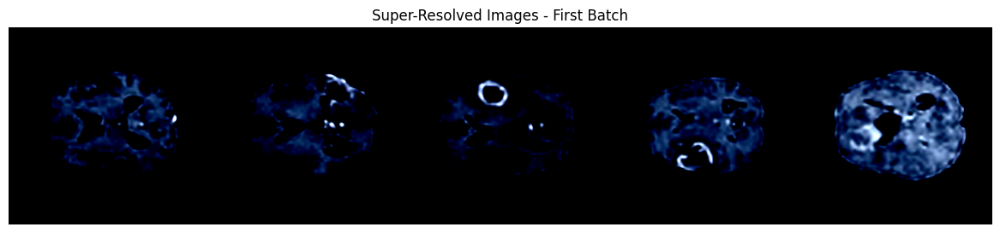

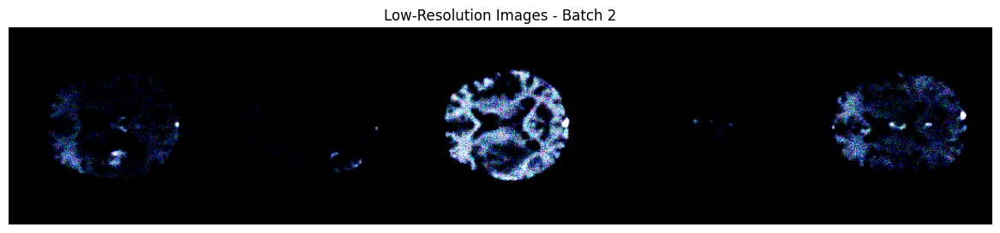

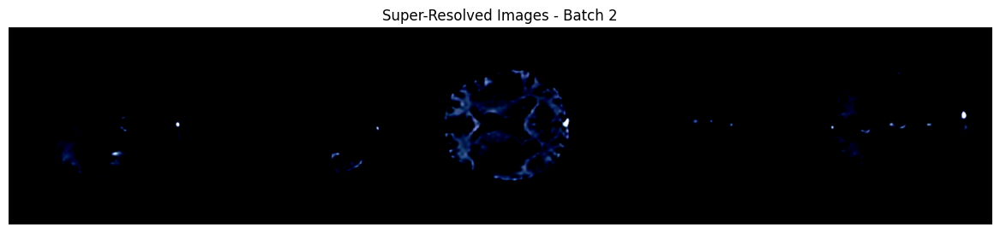

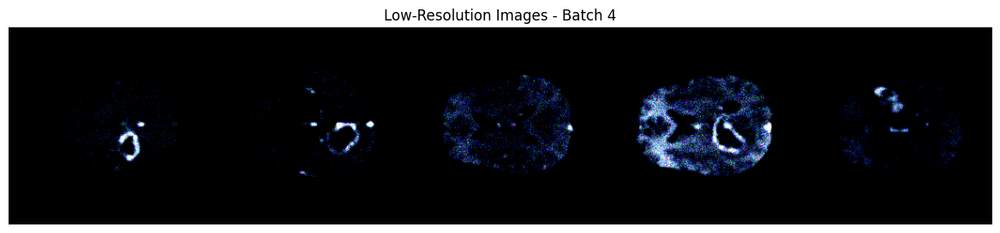

...

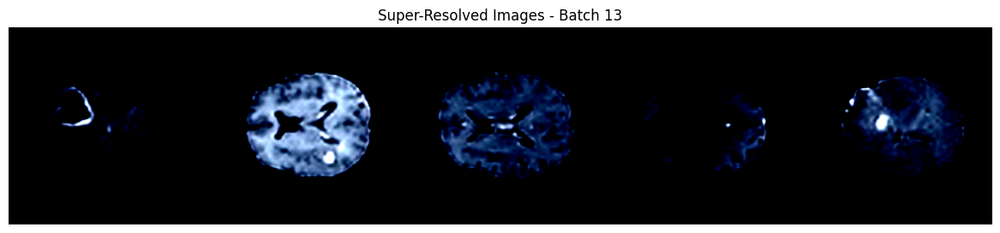

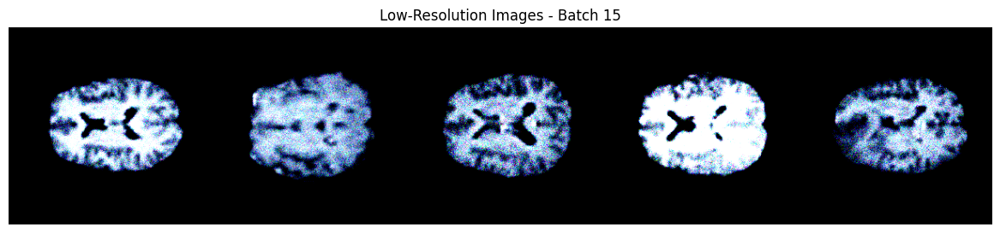

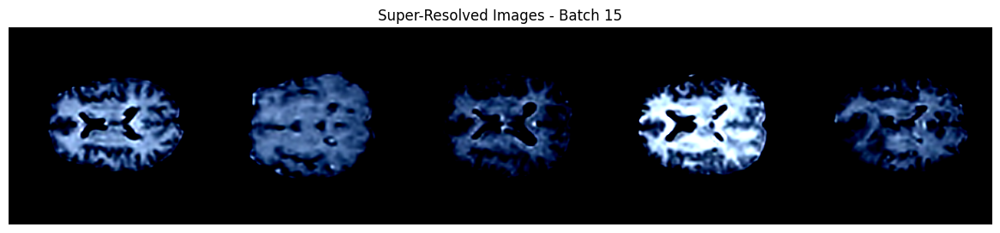

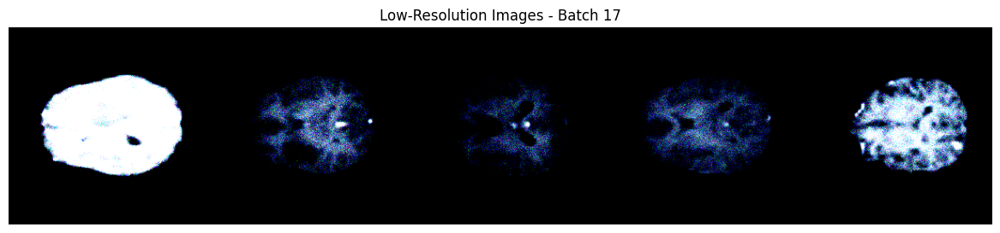

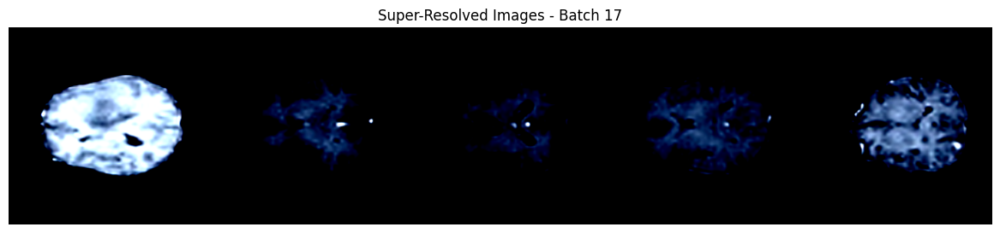

Testing Loss: 0.01582049994660203, PSNR: 24.059078216552734, SSIM: 0.6899816393852234, LPIPS: 0.16659986972808838, LR PSNR: 18.47357177734375, Pixel Std Dev: 0.6112833346910687


In [35]:
from torchvision.utils import make_grid
from math import ceil

# Assuming 'test_dataset' is already defined and loaded
test_loader = DataLoader(test_dataset_loaded, batch_size=16, shuffle=True)

#To visualize the first five images from the first batch and then every 10% of the batch
#size until reaching the last batch (can change as needed)

num_batches = len(test_loader)
batch_intervals = [ceil(num_batches * i / 10) for i in range(10)]  # Every 10% of the batch size

# Function to visualize images
def visualize_images(batch, title=''):
    images = torch.stack([batch[i] for i in range(min(len(batch), 5))])  # Stack the first 5 images
    grid = make_grid(images, nrow=5)
    plt.figure(figsize=(15, 3))
    plt.imshow(grid.permute(1, 2, 0).cpu())
    plt.title(title)
    plt.axis('off')
    plt.show()

# Test the model
model.eval()
with torch.no_grad():
    for i, batch in enumerate(test_loader):
        hr_images = batch['hr'].to(device)
        lr_images = batch['lr'].to(device)
        outputs = model(lr_images)

        if i == 0:
            visualize_images(lr_images, title='Low-Resolution Images - First Batch')
            visualize_images(outputs, title='Super-Resolved Images - First Batch')
        elif i in batch_intervals:
            visualize_images(lr_images, title=f'Low-Resolution Images - Batch {i}')
            visualize_images(outputs, title=f'Super-Resolved Images - Batch {i}')
        elif i == num_batches - 1:
            visualize_images(lr_images, title='Low-Resolution Images - Last Batch')
            visualize_images(outputs, title='Super-Resolved Images - Last Batch')

        # Calculate loss
        loss = criterion(outputs, hr_images)
        val_loss += loss.item()

        # Calculate other metrics
        batch_psnr, batch_ssim, batch_lpips, batch_lr_psnr, batch_pixel_std = compute_metrics(model, validation_loader)
        psnr += batch_psnr
        ssim += batch_ssim
        lpips_value += batch_lpips
        lr_psnr += batch_lr_psnr
        pixel_std_dev += batch_pixel_std

    # Average metrics over all batches
    num_batches = len(validation_loader)
    val_loss /= num_batches
    psnr /= num_batches
    ssim /= num_batches
    lpips_value /= num_batches
    lr_psnr /= num_batches
    pixel_std_dev /= num_batches

print(f'Testing Loss: {val_loss}, PSNR: {psnr}, SSIM: {ssim}, LPIPS: {lpips_value}, LR PSNR: {lr_psnr}, Pixel Std Dev: {pixel_std_dev}')

# **7. Results**

* Run the block below for table summary of the project results

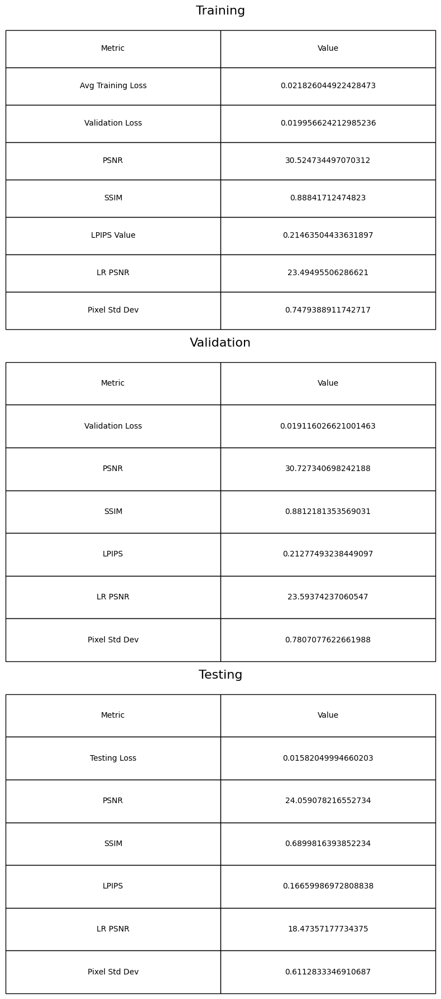

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

# Function to format the axes for the tables
def format_ax(ax):
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
    ax.set_frame_on(False)

# Data for the tables
data1 = {
    'Metric': ['Avg Training Loss', 'Validation Loss', 'PSNR', 'SSIM', 'LPIPS Value', 'LR PSNR', 'Pixel Std Dev'],
    'Value': [0.021826044922428473, 0.019956624212985236, 30.524734497070312, 0.88841712474823, 0.21463504433631897, 23.49495506286621, 0.7479388911742717]
}

data2 = {
    'Metric': ['Validation Loss', 'PSNR', 'SSIM', 'LPIPS', 'LR PSNR', 'Pixel Std Dev'],
    'Value': [0.019116026621001463, 30.727340698242188, 0.8812181353569031, 0.21277493238449097, 23.59374237060547, 0.7807077622661988]
}

data3 = {
    'Metric': ['Testing Loss', 'PSNR', 'SSIM', 'LPIPS', 'LR PSNR', 'Pixel Std Dev'],
    'Value': [0.01582049994660203, 24.059078216552734, 0.6899816393852234, 0.16659986972808838, 18.47357177734375, 0.6112833346910687]
}

# Creating dataframes
df1 = pd.DataFrame(data1)
df2 = pd.DataFrame(data2)
df3 = pd.DataFrame(data3)

# Adjusting the plot to display tables vertically and in a larger format
fig, axs = plt.subplots(3, 1, figsize=(8, 18))  # Adjusted figure size for better spacing

# Plot each table with titles
axs[0].table(cellText=df1.values, colLabels=df1.columns, cellLoc='center', loc='center', bbox=[0, 0, 1, 1])
axs[0].set_title("Training", fontsize=16, pad=20)

axs[1].table(cellText=df2.values, colLabels=df2.columns, cellLoc='center', loc='center', bbox=[0, 0, 1, 1])
axs[1].set_title("Validation", fontsize=16, pad=20)

axs[2].table(cellText=df3.values, colLabels=df3.columns, cellLoc='center', loc='center', bbox=[0, 0, 1, 1])
axs[2].set_title("Testing", fontsize=16, pad=20)

# Format each axis
for ax in axs:
    format_ax(ax)

plt.tight_layout()
plt.show()


In [9]:
from PIL import Image
import numpy as np
import os

def load_images(paths):
    """ Load images from given file paths. """
    return [Image.open(path) for path in paths]

def get_median_size(images):
    """ Find the median width and height from a list of images. """
    widths, heights = zip(*[img.size for img in images])
    median_width, median_height = int(np.median(widths)), int(np.median(heights))
    return median_width, median_height

def crop_to_median_size(images, median_width, median_height):
    """ Crop images to the median width and height. """
    cropped_images = []
    for img in images:
        width, height = img.size
        left = (width - median_width) / 2
        top = (height - median_height) / 2
        right = (width + median_width) / 2
        bottom = (height + median_height) / 2

        cropped_images.append(img.crop((left, top, right, bottom)))
    return cropped_images

# List of paths to your images
image_paths = ['/content/drive/MyDrive/img3.png', '/content/drive/MyDrive/img2.png', '/content/drive/MyDrive/img1.png']

# Load images
images = load_images(image_paths)

# Get median size
median_width, median_height = get_median_size(images)

# Crop images
cropped_images = crop_to_median_size(images, median_width, median_height)

# Save or display cropped images

for i, img in enumerate(cropped_images):
  dirname, filename = os.path.split(image_paths[i])
  new_filename = f'cropped_{filename}'
  img.save(os.path.join(dirname, new_filename))